# Mapping visualizations to common visualization space

Consider a query-match pair of images. The query image is the image of an animal that we want to find a match for in the database. The match image is an image of an animal in the database that we think could be a good match, according to some pre-trained matching criteria.

To explain why a matching method might have made a decision, we can sometimes draw visualizations on top of the query-match pair to guide the user.

Hotspotter (the original visualization method that users from WildMe seem to like) generates visualizations as ellipses and lines drawn from the query to match image that highlight special regions where the algorithm discovered interesting features. These keypoints and ellipses are discrete points in 2D image coordinate space.

**LightGlue** generates visualizations as keypoints drawn on a query-match image pair, optionally with lines and polygons. The sets of keypoints in the query-match pair are discrete points in the 2D image coordinate space.

**GradCam** generates visualizations as a continuous intensity map, drawing an intensity value for each pixel in the image coordinate space.

As we wish to express some quantitative notion of agreement between Hotspotter's visualizations and that of LightGlue and GradCam, we need to map them into a common visualization space. This common visualization space will be contour maps with confidence regions (conformal map?).

### Technique 1: Learning a classifier for drawing boundaries on keypoints in 2D space

In [1]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn import svm
from sklearn.datasets import make_blobs, make_classification
from sklearn.model_selection import train_test_split
from sklearn.inspection import DecisionBoundaryDisplay

def plot_svm_with_decision_boundary(
        X: np.ndarray,
        ax = None,
        long_title = True,
        support_vectors = True,
        svm_kwargs = {"kernel":"rbf", "gamma":0.5},
        axis_boundaries = [-1, 1, -1, 1],
        return_classifier: bool = False
):
    fig = plt.gcf()

    assert len(X.shape) == 2, "X must be a 2-d array"
    y = np.ones(X.shape[0])
    
    # Train the classifier
    clf = svm.OneClassSVM(**svm_kwargs).fit(X, y)

    # Settings for plotting
    if ax is None:
        _, ax = plt.subplots(figsize=(4,4))
    x_min, x_max, y_min, y_max = axis_boundaries
    ax.set(xlim=(x_min, x_max), ylim=(y_min, y_max))
    ax.invert_yaxis()

    # Plot decision boundary and margins
    common_params = {"estimator": clf, "X": X, "ax": ax}
    # DecisionBoundaryDisplay.from_estimator(
    #     **common_params,
    #     response_method="predict",
    #     plot_method="pcolormesh",
    #     alpha=0.1,
    # )
    DecisionBoundaryDisplay.from_estimator(
        **common_params,
        response_method="decision_function",
        plot_method="contour",
        levels=[-1, 0, 1],
        #colors=["red", "orange", "black", "blue", "purple"],
        linestyles=["-"],
    )

    if support_vectors:
        # Plot bigger circles around samples that serve as support vectors
        ax.scatter(
            clf.support_vectors_[:, 0],
            clf.support_vectors_[:, 1],
            s=150,
            facecolors="none",
            edgecolors="k",
        )

    # Plot samples by color and add legend
    scatter = ax.scatter(X[:, 0], X[:, 1], s=10, edgecolors="none", color='lime', linewidths=0)
    #ax.legend(*scatter.legend_elements(), loc="upper right", title="Classes")
    if long_title:
        ax.set_title(f" Decision boundaries of {svm_kwargs['kernel']} kernel in {clf.__class__.__name__}\nparameters: {svm_kwargs}")
    else:
        ax.set_title(svm_kwargs['kernel'])

    if ax is None:
        plt.show()

    if return_classifier:
        return fig, ax, clf
    
    return fig, ax

<Figure size 640x480 with 0 Axes>

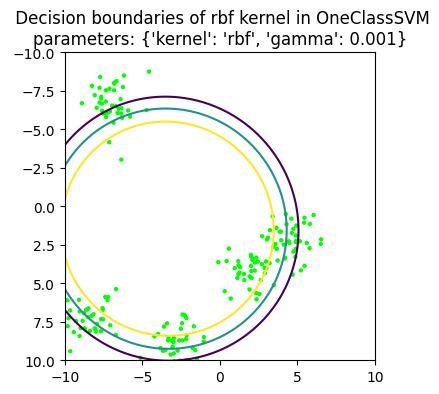

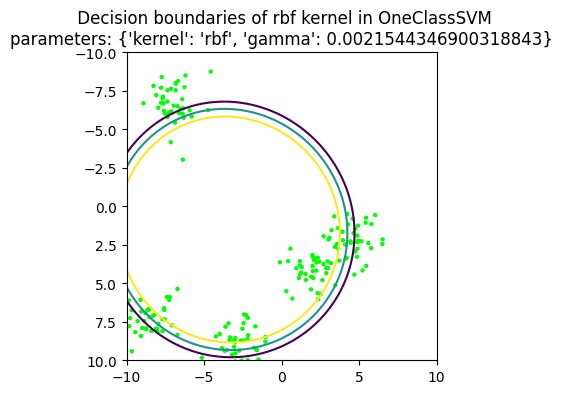

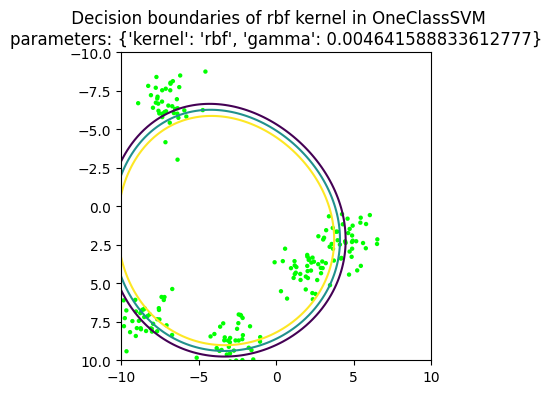

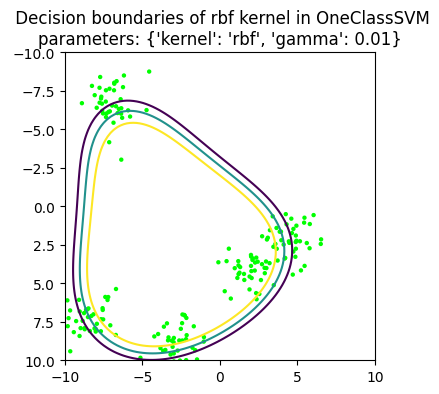

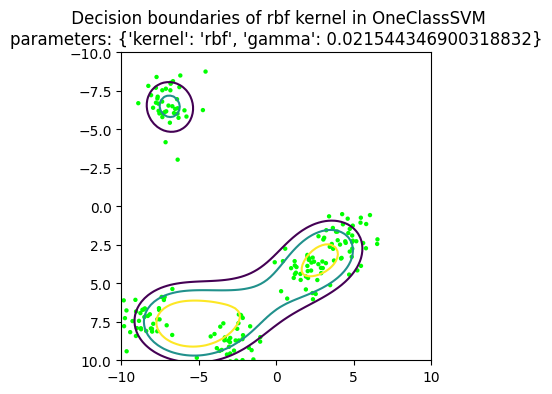

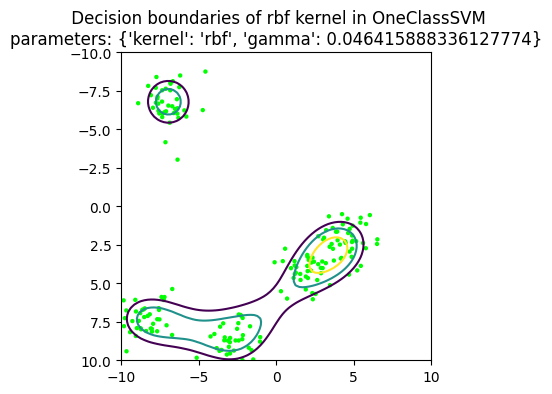

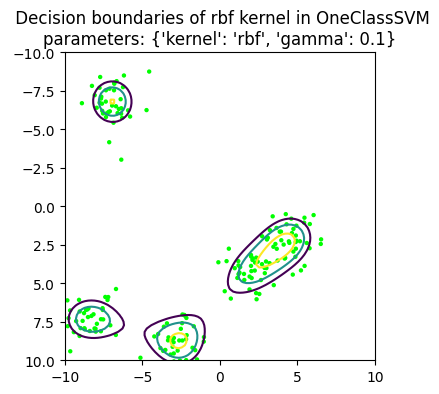

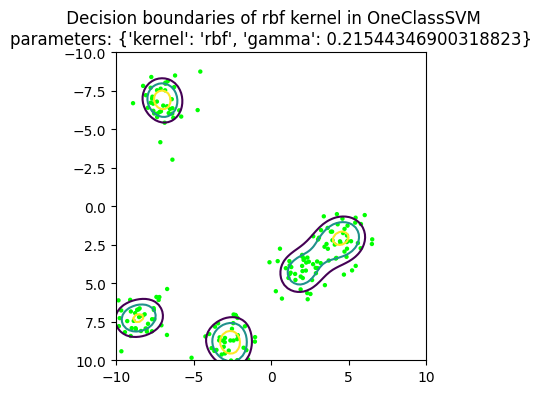

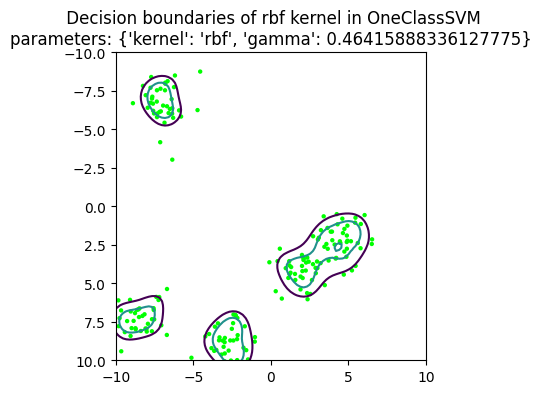

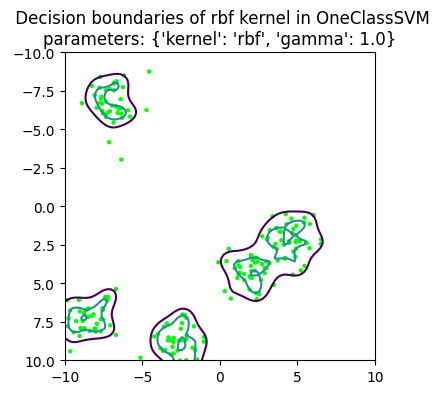

In [2]:
# Test run with fake blob data
X_fake, _ = make_blobs(n_samples=200, n_features=2, centers=5, random_state=42)
for gamma in np.logspace(-3, 0, 10):
    plot_svm_with_decision_boundary(
        X_fake,
        svm_kwargs={"kernel":"rbf", "gamma":gamma},
        support_vectors=False,
        axis_boundaries = [-10, 10, -10, 10]
    )

### Technique 2: Using a threshold for drawing boundaries on density map in 2D space

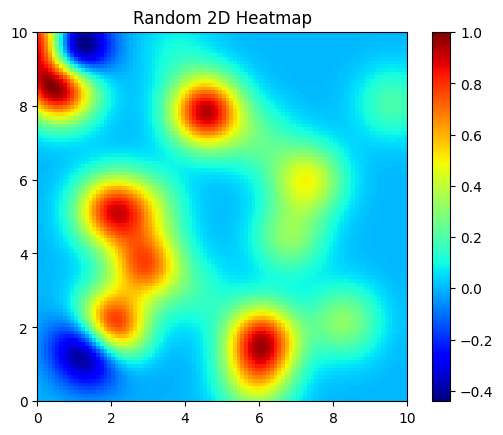

TypeError: DecisionBoundaryDisplay.from_estimator() missing 1 required positional argument: 'X'

In [6]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.gaussian_process import GaussianProcessRegressor
from sklearn.gaussian_process.kernels import RBF, ConstantKernel as C

# Function to generate random heatmap
def generate_random_heatmap(seed=None):
    if seed:
        np.random.seed(seed)
    
    # Define grid
    x = np.linspace(0, 10, 100)
    y = np.linspace(0, 10, 100)
    X, Y = np.meshgrid(x, y)
    xy = np.vstack([X.ravel(), Y.ravel()]).T

    # Gaussian Process setup for smooth random fields
    kernel = C(1.0, (1e-4, 1e1)) * RBF(2.0, (1e-2, 1e1))  # Constant * Radial Basis Kernel
    gp = GaussianProcessRegressor(kernel=kernel, n_restarts_optimizer=10)
    
    # Sample random data points
    random_points = np.random.rand(20, 2) * 10  # Random points in the grid space
    random_values = np.random.rand(20)  # Random heatmap intensity
    
    # Fit and predict over the grid
    gp.fit(random_points, random_values)
    Z, _ = gp.predict(xy, return_std=True)
    
    # Reshape Z to match the grid
    Z = Z.reshape(X.shape)
    
    # Plot heatmap
    plt.imshow(Z, extent=(0, 10, 0, 10), origin='lower', cmap='jet')
    plt.colorbar()
    plt.title("Random 2D Heatmap")
    plt.show()

    # Set a threshold and draw the boundary
    common_params = {"estimator": gp}
    # DecisionBoundaryDisplay.from_estimator(
    #     **common_params,
    #     response_method="predict",
    #     plot_method="pcolormesh",
    #     alpha=0.1,
    # )
    DecisionBoundaryDisplay.from_estimator(
        **common_params,
        response_method="decision_function",
        plot_method="contour",
        levels=[-1, 0, 1],
        #colors=["red", "orange", "black", "blue", "purple"],
        linestyles=["-"],
    )

# Generate random heatmap
generate_random_heatmap(seed=42)

In [3]:
import pandas as pd
import os
from pathlib import Path

from wbia_miew_id.helpers import get_config
from custom_utils import load_miewid_data
from main import main

### Load precomputed matches generated by MiewID
root = Path("../wbia_miew_id/examples")
config = get_config("../wbia_miew_id/examples/beluga_example_miewid/benchmark_model/miew_id.msv2_all.yaml")
visualization_output_dir = Path(root, f"{config.checkpoint_dir}/{config.project_name}/{config.exp_name}/visualizations")
df_test, test_dataset, match_results, q_pids, topk_idx, topk_names, match_mat, dist_mat, images = load_miewid_data(visualization_output_dir)

### Set up path to save images
saveroot = "/srv/transparency/wildbook_prototype/data/matches/figures/lightglue/"
os.makedirs(saveroot, exist_ok=True)

# Set up dataframe to store computed results
df_all = pd.DataFrame(columns=[])

Loading config from path: ../wbia_miew_id/examples/beluga_example_miewid/benchmark_model/miew_id.msv2_all.yaml


100%|██████████| 849/849 [00:08<00:00, 104.40it/s]


Loaded images: torch.Size([849, 3, 440, 440])


Generate results for LightGlue (keypoints in image coordinate space) and GradCam (heatmap in image coordinate space).

In [4]:
from LightGlueVisualizer import LightGlueVisualizer

lightglue_results = main(LightGlueVisualizer(), images, topk_idx, match_mat, dist_mat)
#gradcam_results = main(GradCamVisualizer(), images, )

  0%|          | 0/849 [00:00<?, ?it/s]

Vizualizing query 0 and match 4
Vizualizing query 0 and match 9
Vizualizing query 0 and match 7
Vizualizing query 0 and match 2
Vizualizing query 0 and match 8
Vizualizing query 0 and match 6
Vizualizing query 0 and match 1
Vizualizing query 0 and match 199
Vizualizing query 0 and match 376
Vizualizing query 0 and match 350
Vizualizing query 0 and match 42
Vizualizing query 0 and match 349
Vizualizing query 0 and match 348
Vizualizing query 0 and match 799
Vizualizing query 0 and match 814
Vizualizing query 0 and match 177
Vizualizing query 0 and match 568
Vizualizing query 0 and match 3
Vizualizing query 0 and match 44


  0%|          | 0/849 [00:04<?, ?it/s]

Vizualizing query 0 and match 76


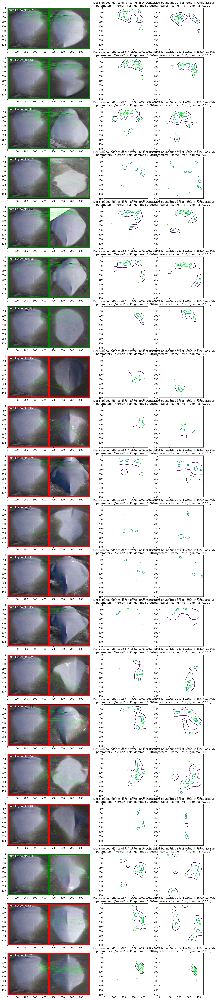

In [13]:
import matplotlib.gridspec as gridspec

plt.close('all')
f = plt.figure(figsize=(16, len(lightglue_results)*4), dpi=150)
gs = gridspec.GridSpec(
    figure=f,
    nrows=len(lightglue_results),
    ncols=3,
    width_ratios=[2,1,1]
    )

for i, result in enumerate(lightglue_results):
    ax0 = plt.subplot(gs[i,0])
    ax1 = plt.subplot(gs[i,1])
    ax2 = plt.subplot(gs[i,2])

    # Plot the visualization over the original image pair
    ax0.imshow(result['figure'])

    # Plot the common visualization
    X_query = result['query_kpts'][0]
    X_match = result['match_kpts'][0]
    plot_svm_with_decision_boundary(
            X=X_query,
            svm_kwargs={"kernel":"rbf", "gamma":0.001},
            support_vectors=False,
            ax=ax1,
            axis_boundaries=[0, result['figure'].shape[0], 0, result['figure'].shape[0]]
    )
    plot_svm_with_decision_boundary(
            X=X_match,
            svm_kwargs={"kernel":"rbf", "gamma":0.001},
            support_vectors=False,
            ax=ax2,
            axis_boundaries=[0, result['figure'].shape[0], 0, result['figure'].shape[0]]
    )

/tmp/ipykernel_1175819/3480627200.py:30: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  ims = np.array(arrays)


<Figure size 640x480 with 0 Axes>

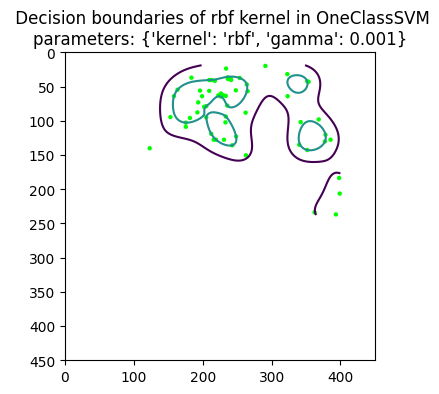

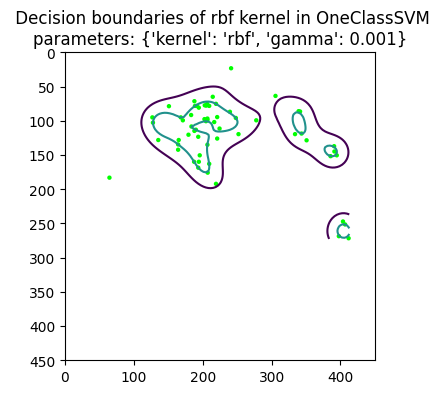

In [14]:
from einops import rearrange
from matplotlib.backends.backend_agg import FigureCanvasAgg
def fig2np(fig) -> np.ndarray:
    canvas = FigureCanvasAgg(fig)
    canvas.draw()
    buf = canvas.buffer_rgba()
    return np.asarray(buf)

plt.close('all')
arrays = []
for i, result in enumerate(lightglue_results):
    X_query = result['query_kpts'][0]
    X_match = result['match_kpts'][0]
    viz_left = result['figure'].copy()
    viz_middle = plot_svm_with_decision_boundary(
                        X=X_query,
                        svm_kwargs={"kernel":"rbf", "gamma":0.001},
                        support_vectors=False,
                        axis_boundaries=[0, result['figure'].shape[0], 0, result['figure'].shape[0]]
        )
    viz_right = plot_svm_with_decision_boundary(
        X=X_match,
        svm_kwargs={"kernel":"rbf", "gamma":0.001},
        support_vectors=False,
        axis_boundaries=[0, result['figure'].shape[0], 0, result['figure'].shape[0]]
        )
    arrays.append([viz_left, viz_middle, viz_right])
    break

ims = np.array(arrays)